# Topic Modelling

In this notebook, Non-negative Matrix Factorization is used to perform topic modelling on the text. Before that, some further preprocessing is done in order to have a good base to start from 

In [5]:
import pandas as pd
import os
import glob
import numpy as np
import nltk
import re
import matplotlib
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer 
from sklearn.decomposition import NMF
import csv
from wordcloud import WordCloud
import matplotlib.pyplot as plt
nltk.download('punkt')
from nltk.stem import PorterStemmer
from sklearn.preprocessing import normalize
from sklearn import decomposition
from itertools import combinations
import gensim
from nltk.corpus import stopwords
from PIL import Image
from gensim.test.utils import common_corpus, common_dictionary
from gensim.models.ldamodel import LdaModel
from gensim.models.coherencemodel import CoherenceModel

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\miria\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\miria\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Needed functions (conatined in https://github.com/MiriamGiuliani/OJSimpson-text-mining-trail-transcripts/blob/2120634c703f2d81118ae1558e9cab1a9a53a502/py_scripts/nb_models.py)

In [6]:
from nb_models import rem_punct, tokenize, stopwords_rem, stemming, get_descriptor, plot_top_term_weights, get_top_snippets, TokenGenerator, calculate_coherence, calculate_singlecoherence, keep

In [8]:
df = pd.read_csv('data.csv')
df = df.iloc[: , 1:]
df.head()

,person,speech,date,time,number_of_words,norm_speech,negation_handling,anaphora_solved
0,THECOURT,BACK ON THE RECORD IN THE SIMPSON MATTER. MR. ...,"APRIL 13, 1995\n",9:20 A.M.,28,BACK ON THE RECORD IN THE OJSIMPSON MATTER. OJ...,BACK ON THE RECORD IN THE OJSIMPSON MATTER. OJ...,BACK ON THE RECORD IN THE OJSIMPSON MATTER. OJ...
1,THECOURT,ALL RIGHT. THE PEOPLE ARE REPRESENTED BY MR. G...,"APRIL 13, 1995\n",9:20 A.M.,48,ALL RIGHT. THE PEOPLE ARE REPRESENTED BY MRGOL...,ALL RIGHT. THE PEOPLE ARE REPRESENTED BY MRGOL...,ALL RIGHT. THE PEOPLE ARE REPRESENTED BY MRGOL...
2,MRGOLDBERG,"YOUR HONOR, MY UNDERSTANDING OF THE COURT'S OR...","APRIL 13, 1995\n",9:20 A.M.,65,"THECOURT, MY UNDERSTANDING OF THECOURT'S ORDER...","THECOURT, MY UNDERSTANDING OF THECOURT'S ORDER...","THECOURT, MY UNDERSTANDING OF THECOURT'S ORDER..."
3,MRSCHECK,"WELL, YOUR HONOR, BEFORE WE LEFT WE GAVE MR. G...","APRIL 13, 1995\n",9:20 A.M.,69,"WELL, THECOURT, BEFORE WE LEFT WE GAVE MRGOLDB...","WELL, THECOURT, BEFORE WE LEFT WE GAVE MRGOLDB...","WELL, THECOURT, BEFORE MRSCHECK LEFT MRSCHECK ..."
4,THECOURT,"WELL, AS I RECALL, AS WE ENDED THE COURT DAY I...","APRIL 13, 1995\n",9:20 A.M.,18,"WELL, AS I RECALL, AS WE ENDED THECOURT DAY I ...","WELL, AS I RECALL, AS WE ENDED THECOURT DAY I ...","WELL, AS THECOURT RECALL, AS THECOURT ENDED TH..."


# Final Pre-processing

## Bring everything to lower case

In [9]:
# Set all the text to lower case
df['person'] = df['person'].str.lower()
df['speech'] = df['speech'].str.lower()
df['norm_speech'] = df['norm_speech'].str.lower()
df['negation_handling'] = df['negation_handling'].str.lower()
df['anaphora_solved'] = df['anaphora_solved'].str.lower()
df['date'] = df['date'].str.lower()

## Remove punctuation

In [10]:
df['anaphora_nopunct'] = df['anaphora_solved'].apply(lambda x: rem_punct(x))

## Perform tokenization

In [11]:
df['tokenized'] = df['anaphora_nopunct'].apply(lambda x: tokenize(x))

## Perform Stemming and Remove Stopwords

In [12]:
list_stopwords = stopwords.words('english')
list_stopwords.remove('against')
more_stopwords = ['okay', 'ok','thank','thanks','alright','yes','no', 'would', 'well', 'like', 'sorri', 'one', 'that', 'this', 'these', 'those']

In [13]:
list_stopwords.extend(more_stopwords)
#list_stopwords

In [14]:
df['tokenized']  = df['tokenized'].apply(lambda x: stopwords_rem(x, list_stopwords))

In [15]:
df['stemmed']  = df['tokenized'].apply(lambda x: stemming(x))

In [16]:
df.head()

,person,speech,date,time,number_of_words,norm_speech,negation_handling,anaphora_solved,anaphora_nopunct,tokenized,stemmed
0,thecourt,back on the record in the simpson matter. mr. ...,"april 13, 1995\n",9:20 A.M.,28,back on the record in the ojsimpson matter. oj...,back on the record in the ojsimpson matter. oj...,back on the record in the ojsimpson matter. oj...,back on the record in the ojsimpson matter ojs...,"[back, record, ojsimpson, matter, ojsimpson, i...","[back, record, ojsimpson, matter, ojsimpson, i..."
1,thecourt,all right. the people are represented by mr. g...,"april 13, 1995\n",9:20 A.M.,48,all right. the people are represented by mrgol...,all right. the people are represented by mrgol...,all right. the people are represented by mrgol...,all right the people are represented by mrgold...,"[right, people, represented, mrgoldberg, mrdar...","[right, peopl, repres, mrgoldberg, mrdarden, j..."
2,mrgoldberg,"your honor, my understanding of the court's or...","april 13, 1995\n",9:20 A.M.,65,"thecourt, my understanding of thecourt's order...","thecourt, my understanding of thecourt's order...","thecourt, my understanding of thecourt's order...",thecourt my understanding of thecourts orders ...,"[thecourt, understanding, thecourts, orders, l...","[thecourt, understand, thecourt, order, lastni..."
3,mrscheck,"well, your honor, before we left we gave mr. g...","april 13, 1995\n",9:20 A.M.,69,"well, thecourt, before we left we gave mrgoldb...","well, thecourt, before we left we gave mrgoldb...","well, thecourt, before mrscheck left mrscheck ...",well thecourt before mrscheck left mrscheck ga...,"[thecourt, mrscheck, left, mrscheck, gave, mrg...","[thecourt, mrscheck, left, mrscheck, gave, mrg..."
4,thecourt,"well, as i recall, as we ended the court day i...","april 13, 1995\n",9:20 A.M.,18,"well, as i recall, as we ended thecourt day i ...","well, as i recall, as we ended thecourt day i ...","well, as thecourt recall, as thecourt ended th...",well as thecourt recall as thecourt ended thec...,"[thecourt, recall, thecourt, ended, thecourt, ...","[thecourt, recal, thecourt, end, thecourt, day..."


# Build a TF-IDF matrix

In [17]:
# Compute tf-idf
tfidf_vectorizer = TfidfVectorizer(
    min_df=3,
    max_df=0.85,
    ngram_range=(1, 1),
    preprocessor=' '.join
)

In [18]:
text_all = df['tokenized']
tfidf_all = tfidf_vectorizer.fit_transform(text_all)
tfidf_all.shape

(234700, 34708)

# NMF - Topic Modeling

Let's start with 10 topics and see how we can interpret them

In [19]:
model_all = NMF(n_components = 10, random_state=5)
# Fit the model to TF-IDF
model_all.fit(tfidf_all)
# Transform the TF-IDF: nmf_features
nmf_features_all = model_all.transform(tfidf_all)
nmf_features_all.shape

C:\Users\miria\AppData\Local\Programs\Python\Python38-32\lib\site-packages\sklearn\decomposition\_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "


(234700, 10)

In [20]:
# NMF Function to retrieve topics
def get_nmf_topics(model, n_top_words, nr_top):
    feat_names = tfidf_vectorizer.get_feature_names()
    word_dict = {};
    for i in range(nr_top):
        words_ids = model.components_[i].argsort()[:-20 - 1:-1]
        words = [feat_names[key] for key in words_ids]
        word_dict['Topic # ' + '{:02d}'.format(i+1)] = words;  
    return pd.DataFrame(word_dict)

In [23]:
num_topics = 10
nmf_df = get_nmf_topics(model_all, 5, num_topics)
nmf_df

,Topic # 01,Topic # 02,Topic # 03,Topic # 04,Topic # 05,Topic # 06,Topic # 07,Topic # 08,Topic # 09,Topic # 10
0,thecourt,mrcochran,objection,msclark,right,mrdarden,mrscheck,dont,question,mrgoldberg
1,may,may,speculation,sir,thats,may,think,neg_the,sustained,may
2,counsel,see,calls,see,lets,correct,could,neg_that,rephrase,see
3,think,correct,hearsay,tell,jury,moment,may,neg_to,answer,time
4,going,time,leading,photograph,please,ojsimpson,th,neg_you,object,item
5,object,point,irrelevant,may,correct,told,see,neg_it,form,approach
6,let,want,argumentative,ask,indicating,time,mrharmon,neg_of,next,moment
7,moment,ask,vague,peoples,back,lopez,want,neg_know,ask,evidence
8,mrkelberg,think,answered,time,true,see,fung,didnt,overruled,could
9,take,approach,misstates,msclarkm,see,detective,asked,neg_in,asked,look


In [24]:
k = 10
# create the model
model = decomposition.NMF(init="nndsvd", n_components=k) 
# apply the model and extract the two factor matrices
W = model_all.fit_transform(tfidf_all)
H = model_all.components_
terms_all = tfidf_vectorizer.get_feature_names()

C:\Users\miria\AppData\Local\Programs\Python\Python38-32\lib\site-packages\sklearn\decomposition\_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "


For each topic, we can retrieve the most relevant descriptors:

In [25]:
descriptors = []
for topic_index in range(k):
    descriptors.append( get_descriptor( terms_all, H, topic_index, 20))
    str_descriptor = ", ".join( descriptors[topic_index] )
    print("Topic %02d: %s" % ( topic_index+1, str_descriptor ) )

Topic 01: thecourt, may, counsel, think, going, object, let, moment, mrkelberg, take, reporter, mrshapiro, please, ask, excuse, need, jury, witness, see, approach
Topic 02: mrcochran, may, see, correct, time, point, want, ask, think, approach, tell, know, back, saw, object, regard, told, lange, let, recall
Topic 03: objection, speculation, calls, hearsay, leading, irrelevant, argumentative, vague, answered, misstates, asked, scope, beyond, testimony, assumes, neg_foundation, neg_evidence, facts, neg_in, compound
Topic 04: msclark, sir, see, tell, photograph, may, ask, peoples, time, msclarkm, going, recognize, know, recall, could, indicated, lange, show, clark, go
Topic 05: right, thats, lets, jury, please, correct, indicating, back, true, see, miss, counsel, mrkelberg, record, time, mrclarke, ladies, gentlemen, hand, take
Topic 06: mrdarden, may, correct, moment, ojsimpson, told, time, lopez, see, detective, saw, tell, nicolebrown, mrshapiro, miss, ask, witness, ever, say, go
Topic 07

We can visualize the weight of each descriptor, separately by topic:

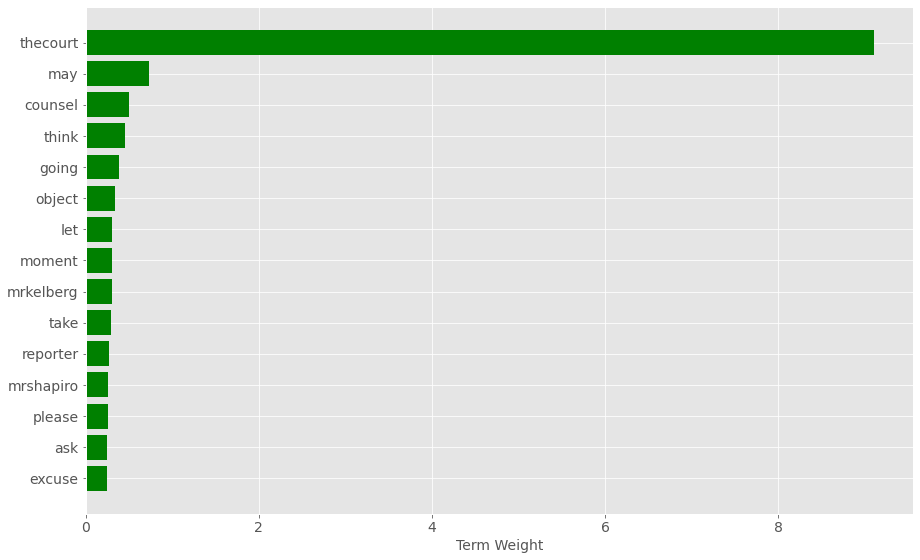

In [26]:
%matplotlib inline
plt.style.use("ggplot")
matplotlib.rcParams.update({"font.size": 14})
plot_top_term_weights(terms_all, H, 0, 15 )

Let's now try to apply NMF to a set of values for the _number of topics_ and to assess which one gives an optima result in terms of coherence within topics. To do so, it is necessary to apply _Word2Vec_ to the text

In [24]:
kmin, kmax = 2, 20
topic_models = []
# try each value of k
for k in range(kmin,kmax+1):
    print("Applying NMF for k=%d ..." % k )
    # run NMF
    model = decomposition.NMF( init="nndsvd", n_components=k ) 
    W = model.fit_transform(tfidf_all)
    H = model.components_    
    # store for later
    topic_models.append( (k,W,H) )

Applying NMF for k=2 ...
Applying NMF for k=3 ...
Applying NMF for k=4 ...
Applying NMF for k=5 ...
Applying NMF for k=6 ...
Applying NMF for k=7 ...
Applying NMF for k=8 ...
Applying NMF for k=9 ...
Applying NMF for k=10 ...
Applying NMF for k=11 ...
Applying NMF for k=12 ...
Applying NMF for k=13 ...
Applying NMF for k=14 ...
Applying NMF for k=15 ...
Applying NMF for k=16 ...
Applying NMF for k=17 ...
Applying NMF for k=18 ...
Applying NMF for k=19 ...
Applying NMF for k=20 ...


In [26]:
raw_documents =df['anaphora_nopunct'].str.strip()
raw_documents= raw_documents.str.lower()
raw_documents = raw_documents.tolist()
stop_words = stopwords.words('english')
docgen = TokenGenerator(raw_documents, stop_words)
w2v_model = gensim.models.Word2Vec(docgen, size=500, min_count=20, sg=1)

Building Word2Vec model ...
Building Word2Vec model ...
Building Word2Vec model ...
Building Word2Vec model ...
Building Word2Vec model ...
Building Word2Vec model ...


In [27]:
k_values = []
coherences = []
for (k,W,H) in topic_models:
    # Get all of the topic descriptors - the term_rankings, based on top 10 terms
    term_rankings = []
    for topic_index in range(k):
        term_rankings.append(get_descriptor(terms_all, H, topic_index, 20))
    # Now calculate the coherence based on our Word2vec model
    k_values.append(k)
    coherences.append(calculate_coherence(w2v_model, term_rankings))
    print("K=%02d: Coherence=%.4f" % ( k, coherences[-1]))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:105: DeprecationWarning: Call to deprecated `__contains__` (Method will be removed in 4.0.0, use self.wv.__contains__() instead).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:108: DeprecationWarning: Call to deprecated `__contains__` (Method will be removed in 4.0.0, use self.wv.__contains__() instead).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:112: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).


K=02: Coherence=0.2061
K=03: Coherence=0.2917
K=04: Coherence=0.2689
K=05: Coherence=0.2595
K=06: Coherence=0.2536
K=07: Coherence=0.2586
K=08: Coherence=0.2642
K=09: Coherence=0.2699
K=10: Coherence=0.2696
K=11: Coherence=0.2679
K=12: Coherence=0.2765
K=13: Coherence=0.2690
K=14: Coherence=0.2708
K=15: Coherence=0.2675
K=16: Coherence=0.2660
K=17: Coherence=0.2631
K=18: Coherence=0.2663
K=19: Coherence=0.2607
K=20: Coherence=0.2601


We can now viasualize the *coherence metric* for different number of topics. The optimal choice seems to be $k = 3$

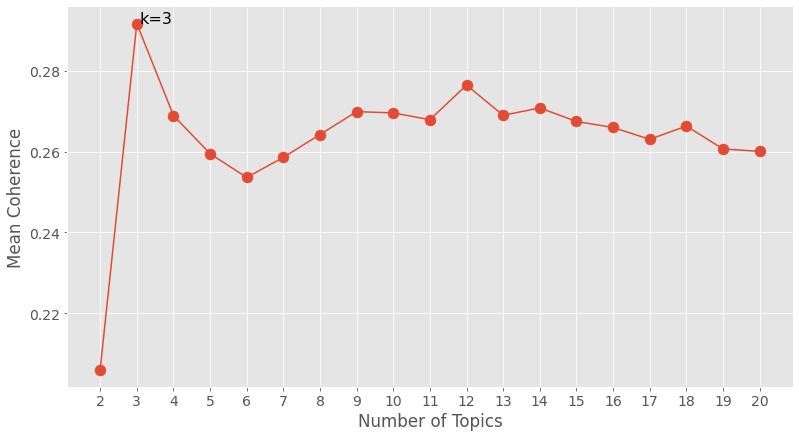

In [29]:
%matplotlib inline
plt.style.use("ggplot")
matplotlib.rcParams.update({"font.size": 14})
fig = plt.figure(figsize=(13,7))
# create the line plot
ax = plt.plot( k_values, coherences )
plt.xticks(k_values)
plt.xlabel("Number of Topics")
plt.ylabel("Mean Coherence")
# add the points
plt.scatter( k_values, coherences, s=120)
# find and annotate the maximum point on the plot
ymax = max(coherences)
xpos = coherences.index(ymax)
best_k = k_values[xpos]
plt.annotate( "k=%d" % best_k, xy=(best_k, ymax), xytext=(best_k, ymax), textcoords="offset points", fontsize=16)
# show the plot
plt.show()

In [30]:
# Create a DataFrame: components_df
components_dfall = pd.DataFrame(model_all.components_, columns=tfidf_vectorizer.get_feature_names())
components_dfall

,aa,aan,aand,aare,aaronson,aaronsons,aas,aat,aattorneys,ab,abag,aband,abandon,abandoned,abbreviation,abc,abdomen,abdominal,abe,abernathy,abetter,abetween,abide,abiding,abig,abilities,ability,abilityto,abindle,abit,ablack,ablanket,able,ableto,ablind,ablood,abloodstain,abloody,ably,abnormal,...,youwhat,youwhen,youwhether,youwill,youwish,youwith,youwont,youwould,youwouldnt,youwrite,youwrote,youyesterday,youyou,youyouyou,yow,yshaped,yttrium,yup,zabell,zack,zajac,zeal,zealand,zeigler,zero,zeroes,zigzag,ziona,zip,ziplock,zipper,zlomsowitch,zone,zoology,zoom,zoomed,zoomin,zooming,zulema,zx
0,0.000548,0.000180,0.001157,0.000000,0.001047,0.000000,0.000000,0.000021,0.000000,0.000000,0.000000,0.000000,0.000000,0.000178,0.000000,0.000598,0.000000,0.000000,0.000000,0.000142,0.000320,0.000000,0.002107,0.000044,0.000057,0.000130,0.007325,0.000076,0.000000,0.000000,0.000062,0.000000,0.014727,0.000254,0.000000e+00,0.000000,0.000000,0.000000,0.000154,0.000000,...,0.000000,0.000000,0.000000,0.001282,0.000489,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000128,0.000000,0.000000,0.000000,0.000000,0.000000,0.000058,0.000000,0.000678,0.000000e+00,1.033660e-04,0.000000,0.000000e+00,3.176164e-04,0.000000e+00,0.000000,0.000156,0.000000,0.000142,0.000000e+00,0.000067,0.000000,0.000000e+00,0.001614,0.000000,0.000000,0.000000,0.000290,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000721,0.000008,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000316,0.000000,0.002055,0.000000,0.000000,0.000000,0.000000,0.000000,0.000645,0.001321,0.000000,0.000054,0.000333,0.001458,0.000000,0.000000,0.000000,0.000273,0.000000,0.035514,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000332,0.000357,0.000000,0.000453,0.000235,0.000519,0.000000,0.000000,0.000000,0.000135,0.000000,0.000029,0.000000,0.000000,0.000499,0.000004,0.000000,0.000021,0.000000,0.000000,0.000000e+00,5.930840e-05,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,4.452009e-07,0.000034,0.000000,0.000000e+00,0.000000,0.000504,0.000346,0.000000,0.000869,0.000000
2,0.000000,0.000078,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000083,0.000000,0.000000,0.000000,0.000004,0.000000,0.000010,0.000000,0.000000,0.000000,0.000000,0.000011,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000007,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.605866e-07,0.000000e+00,0.000003,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000004,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000439,0.000000,0.000000,0.000000,0.009035,0.000864,0.000309,0.000000,0.000006,0.000000,0.000028,0.000006,0.000002,0.000171,0.000000,0.000000,0.000004,0.000024,0.000015,0.000000,0.000000,0.000086,0.000000,0.000000,0.000025,0.000038,0.005805,0.000000,0.001837,0.000000,0.000373,0.000000,0.059558,0.000566,8.963490e-06,0.000000,0.000019,0.000546,0.000000,0.000298,...,0.000256,0.000081,0.000000,0.000096,0.000169,0.000440,0.000000,0.001631,0.000000,0.000035,0.000041,0.000000,0.000000,0.000004,0.000597,0.000020,0.000330,0.000081,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000004,0.000000e+00,2.128321e-06,0.000000e+00,0.000016,0.000000,0.000006,0.001400,4.835839e-04,0.000000,0.000000,0.000000e+00,0.011963,0.001026,0.000000,0.001316,0.000000,0.001012
4,0.000342,0.000096,0.000103,0.000093,0.003581,0.000118,0.000019,0.000165,0.000007,0.001237,0.000000,0.000020,0.000038,0.000000,0.000281,0.001369,0.000574,0.001440,0.000000,0.000075,0.000016,0.000033,0.000000,0.000000,0.000007,0.000000,0.000397,0.000003,0.000136,0.000120,0.000000,0.000000,0.009124,0.000244,2.593123e-05,0.000192,0.000513,0.000000,0.000038,0.000011,...,0.000000

# Select k = 3

Starting from the results found above, we can perform topic modelling choosing the optimal value of 3 for the number of topics

In [32]:
k = 3
# create the model
from sklearn import decomposition
model3_all = decomposition.NMF(init="nndsvd", n_components=k ) 
# apply the model and extract the two factor matrices
W = model3_all.fit_transform(tfidf_all)
H = model3_all.components_

In [33]:
descriptors = []
for topic_index in range(k):
    descriptors.append( get_descriptor(terms_all, H, topic_index, 30))
    str_descriptor = ", ".join( descriptors[topic_index])
    print("Topic %02d: %s" % ( topic_index+1, str_descriptor))

Topic 01: thecourt, msclark, right, may, mrscheck, mrdarden, mrgoldberg, thats, see, think, counsel, going, question, dont, time, mrkelberg, jury, neg_the, could, ask, please, let, take, neg_to, mrneufeld, mrshapiro, sir, moment, witness, miss
Topic 02: mrcochran, right, may, correct, time, see, neg_that, point, question, want, ask, dont, think, mrdarden, back, know, object, saw, tell, told, approach, lange, regard, neg_to, didnt, let, neg_the, recall, thats, ojsimpson
Topic 03: objection, speculation, calls, hearsay, leading, irrelevant, argumentative, vague, answered, misstates, asked, scope, beyond, question, sustained, testimony, assumes, neg_foundation, neg_evidence, facts, thats, neg_in, form, overruled, foundation, compound, strike, thecourt, object, improper


## Descriptors for Topic 1

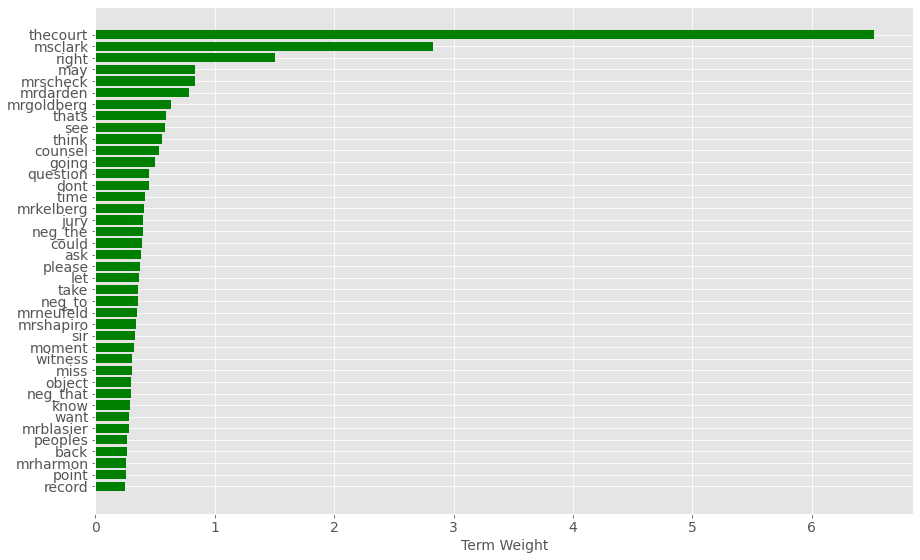

In [35]:
%matplotlib inline
plt.style.use("ggplot")
matplotlib.rcParams.update({"font.size": 14})
plot_top_term_weights(terms_all, H, 0, 40)

## Descriptors for Topic 2

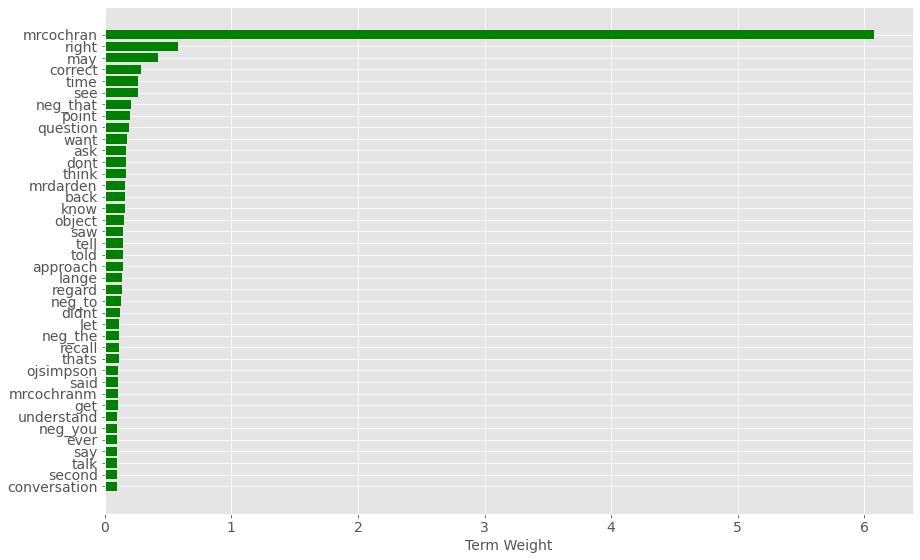

In [36]:
plot_top_term_weights(terms_all, H, 1, 40)

## Descriptors for Topic 3

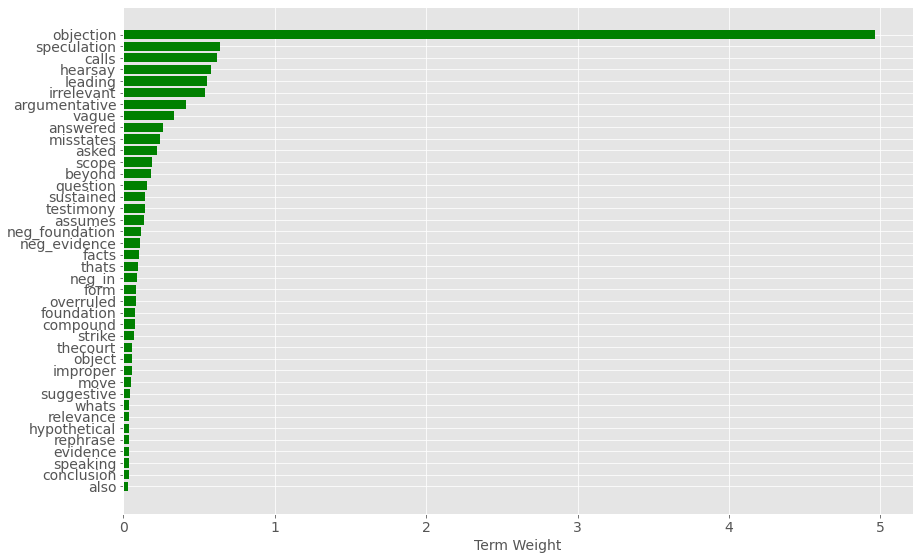

In [37]:
plot_top_term_weights(terms_all, H, 2, 40)

In [38]:
# Create a DataFrame: components_df
components_df3 = pd.DataFrame(H, columns = tfidf_vectorizer.get_feature_names())
components_df3

,aa,aan,aand,aare,aaronson,aaronsons,aas,aat,aattorneys,ab,abag,aband,abandon,abandoned,abbreviation,abc,abdomen,abdominal,abe,abernathy,abetter,abetween,abide,abiding,abig,abilities,ability,abilityto,abindle,abit,ablack,ablanket,able,ableto,ablind,ablood,abloodstain,abloody,ably,abnormal,...,youwhat,youwhen,youwhether,youwill,youwish,youwith,youwont,youwould,youwouldnt,youwrite,youwrote,youyesterday,youyou,youyouyou,yow,yshaped,yttrium,yup,zabell,zack,zajac,zeal,zealand,zeigler,zero,zeroes,zigzag,ziona,zip,ziplock,zipper,zlomsowitch,zone,zoology,zoom,zoomed,zoomin,zooming,zulema,zx
0,0.001112,0.000285,0.001509,0.000254,0.005949,0.000491,0.000179,0.000207,0.000020,0.00067,0.000144,0.000096,0.000050,0.000350,0.000069,0.001033,0.000380,0.000803,0.000101,0.000212,0.000381,0.000058,0.001833,0.000108,0.000132,0.000454,0.012095,0.000147,0.000715,0.000188,0.000341,0.000077,0.062034,0.001340,0.000066,0.000215,0.000338,0.000277,0.000178,0.000239,...,0.000279,0.000249,0.000209,0.001891,0.000405,0.000294,0.000059,0.003713,0.000237,0.000085,0.000375,0.000256,0.000330,0.000068,0.000135,0.000032,0.000144,0.000175,0.000180,0.000947,0.000168,0.000098,0.000060,0.000057,0.001521,0.000076,0.000180,0.000152,0.000189,0.000743,0.000587,0.000101,0.000220,3.448672e-05,0.007914,0.000416,0.000107,0.000693,0.000252,0.000364
1,0.000059,0.000002,0.000000,0.000000,0.001016,0.000019,0.000007,0.000005,0.000003,0.00009,0.000054,0.000025,0.000011,0.000353,0.000008,0.002264,0.000093,0.000108,0.000013,0.000000,0.000000,0.000638,0.001409,0.000000,0.000069,0.000414,0.002319,0.000011,0.000000,0.000033,0.000270,0.000012,0.038868,0.000037,0.000019,0.000037,0.000068,0.000003,0.000000,0.000039,...,0.000369,0.000423,0.000142,0.000639,0.000224,0.000586,0.000024,0.000532,0.000080,0.000154,0.000078,0.000044,0.000088,0.000023,0.000499,0.000008,0.000000,0.000029,0.000035,0.000000,0.000020,0.000064,0.000010,0.000016,0.000092,0.000024,0.000039,0.000000,0.000041,0.000000,0.000108,0.000048,0.000064,9.455244e-06,0.000000,0.000481,0.000388,0.000000,0.000873,0.000000
2,0.000000,0.000077,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000011,0.000000,0.000004,0.000000,0.000000,0.000000,0.000000,0.000065,0.000000,0.000000,0.000000,0.000004,0.000000,0.000008,0.000000,0.000000,0.000000,0.000000,0.000002,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000006,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000007,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000002,0.000000,0.000001,0.000001,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000003,0.000000,5.901171e-07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


## Visualization with word cloud

In [39]:
list_bytopic = list()
for row in range(0, components_df3.shape[0]):
  topic = components_df3.iloc[[row]]
  topic = topic.sort_values(by = row, axis=1, ascending=False)
  key_topic = list(topic.columns)
  val_topic = list(topic.iloc[0])
  zip_iterator = zip( key_topic, val_topic)
  dict_topic = dict(zip_iterator)
  list_bytopic.append(dict_topic)

In [41]:
def one_color_func(word=None, font_size=None, 
                   position=None, orientation=None, 
                   font_path=None, random_state=None):
  h = 346 # 0 - 360
  s = 86 # 0 - 100
  l = 55 # 0 - 100
  return "hsl({}, {}%, {}%)".format(h, s, l)
def similar_color_func_1(word=None, font_size=None,
                       position=None, orientation=None,
                       font_path=None, random_state=None):
  h = 346 # 0 - 360
  s = 86 # 0 - 100
  l = random_state.randint(30, 60) # 0 - 100
  return "hsl({}, {}%, {}%)".format(h, s, l)
def similar_color_func_2(word=None, font_size=None,
                       position=None, orientation=None,
                       font_path=None, random_state=None):
  h = 201 # 0 - 360
  s = 92 # 0 - 100
  l = random_state.randint(5, 28) # 0 - 100
  return "hsl({}, {}%, {}%)".format(h, s, l)
def similar_color_func_3(word=None, font_size=None,
                       position=None, orientation=None,
                       font_path=None, random_state=None):
  h = 157 # 0 - 360
  s = 100 # 0 - 100
  l = random_state.randint(3, 26) # 0 - 100
  return "hsl({}, {}%, {}%)".format(h, s, l)

### Topic 1

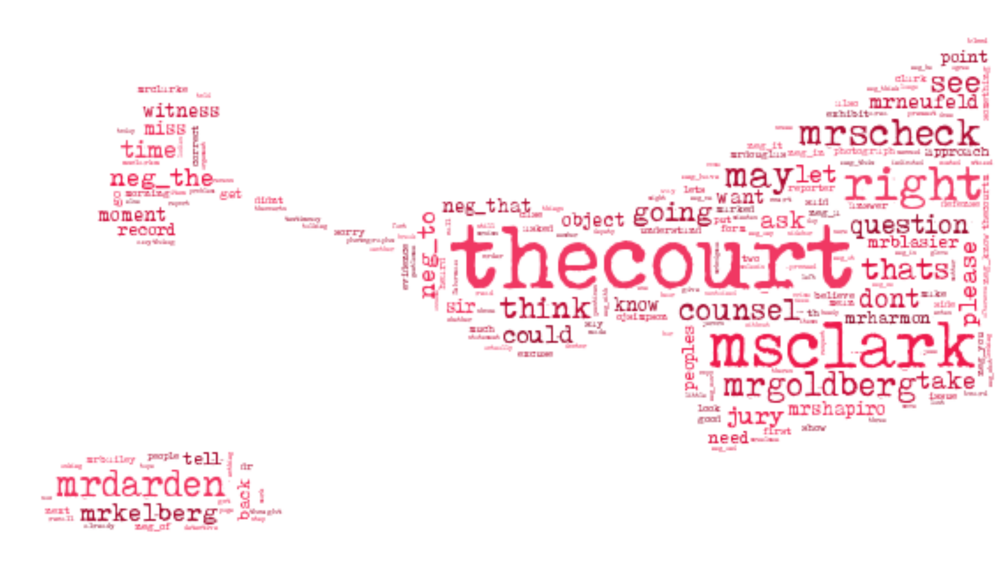

In [42]:
font_path = '/content/drive/MyDrive/Tox Typewriter.ttf'
mask = np.array(Image.open('/content/drive/MyDrive/Cattura.JPG'))
wordcloud = WordCloud(width=mask.shape[1], height=mask.shape[0],color_func=similar_color_func_1,max_words=1628, mask=mask,font_path=font_path, background_color='white',normalize_plurals=False).generate_from_frequencies(list_bytopic[0])
plt.figure( figsize=(50,30) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
#plt.savefig("Topic1.png")
#files.download("Topic1.png")
plt.show()

### Topic 2

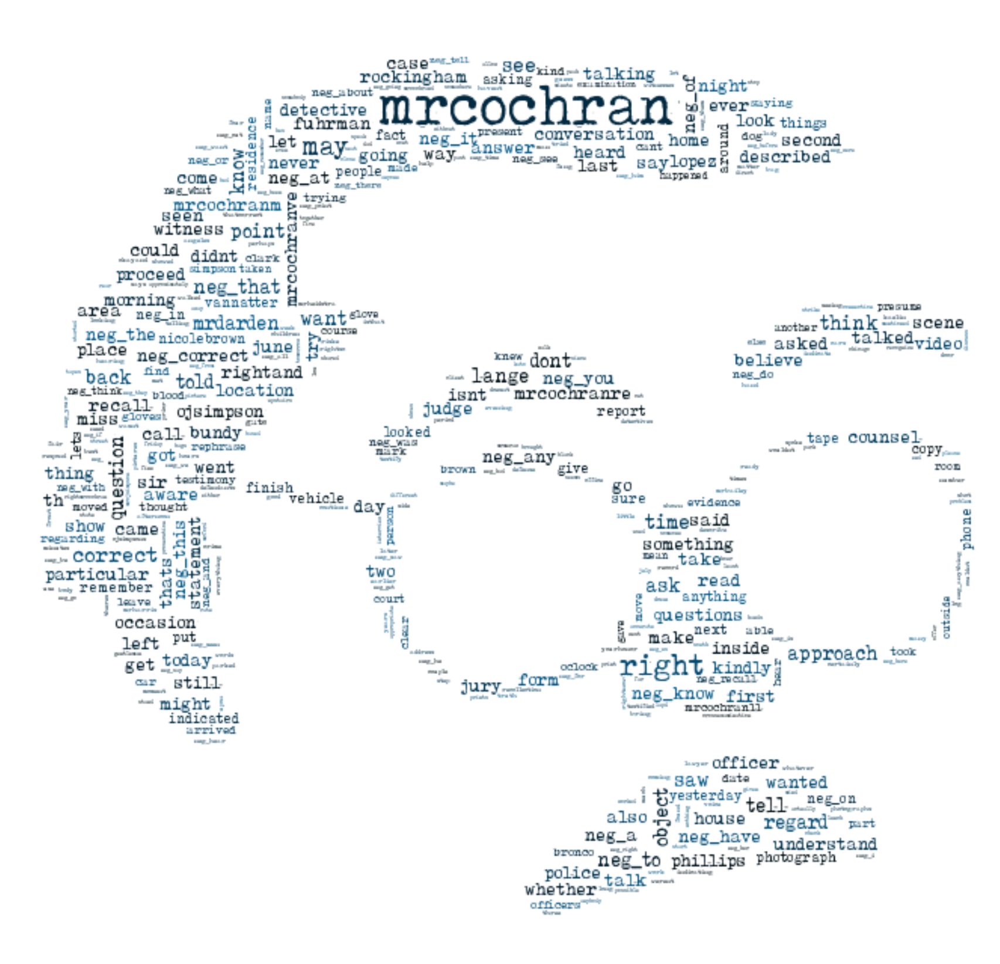

In [44]:
mask = np.array(Image.open('/content/drive/MyDrive/cochran2.JPG'))
wordcloud = WordCloud(width=mask.shape[1], height=mask.shape[0],color_func=similar_color_func_2,max_words=1628, mask=mask,font_path=font_path, background_color='white',normalize_plurals=False).generate_from_frequencies(list_bytopic[1])
#wordcloud = WordCloud(width=mask.shape[1], height=600,max_words=1628, font_path=font_path, background_color='white',normalize_plurals=False).generate_from_frequencies(list_bytopic[0])
plt.figure( figsize=(50,30) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
#plt.savefig("Cochran.png")
#files.download("Cochran.png") 
plt.show()


### Topic 3

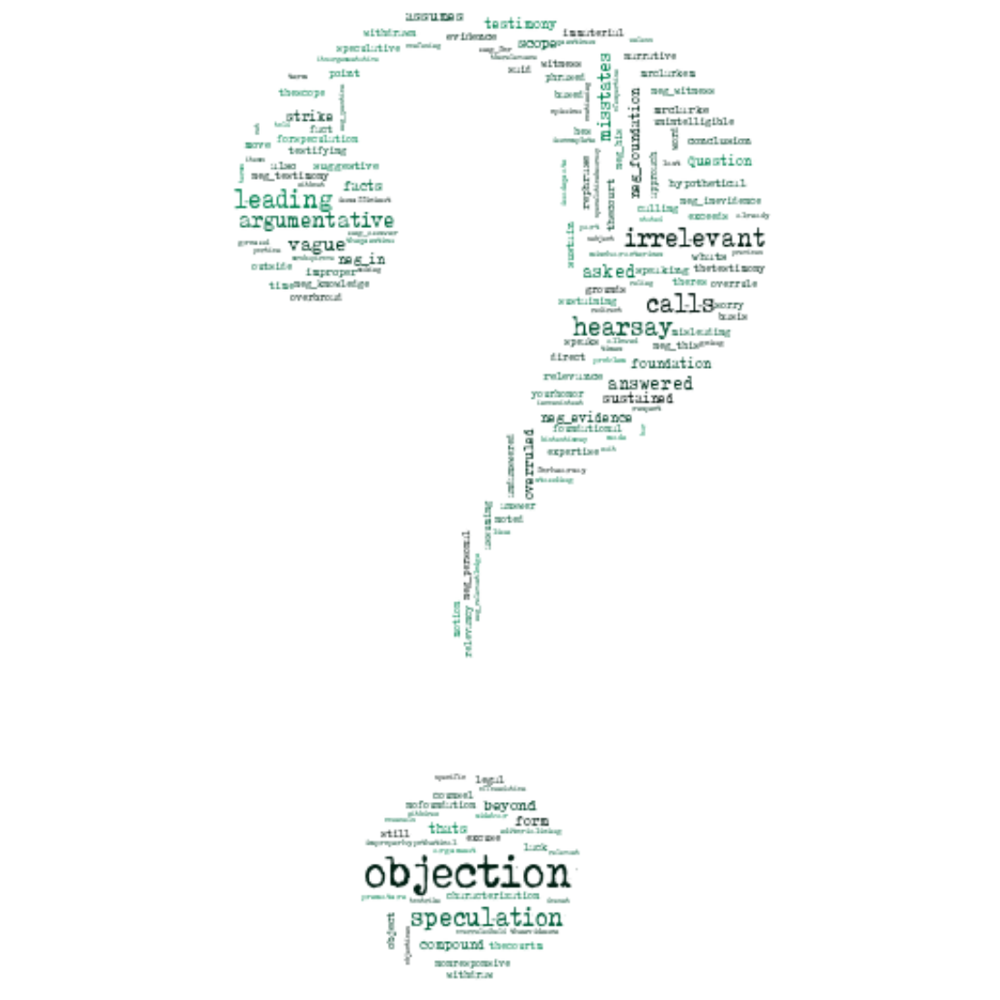

In [46]:
from google.colab import files

mask = np.array(Image.open('/content/drive/MyDrive/question-mark-512.jpg'))
wordcloud = WordCloud(width=mask.shape[1],max_font_size=256, height=mask.shape[0],color_func=similar_color_func_3,max_words=1700, mask=mask,font_path=font_path, background_color='white',normalize_plurals=False).generate_from_frequencies(list_bytopic[2])
#wordcloud = WordCloud(width=mask.shape[1], height=600,max_words=1628, font_path=font_path, background_color='white',normalize_plurals=False).generate_from_frequencies(list_bytopic[0])
plt.figure( figsize=(40,20) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
#plt.savefig("Topic3.png")
#files.download("Topic3.png") 
plt.show()

## Analyze topics composition based on the person talking

In [48]:
nmf_features3 = model3_all.transform(tfidf_all)
features = pd.DataFrame(nmf_features3)
features

,0,1,2
0,0.025430,0.026596,0.000000
1,0.056782,0.000000,0.000000
2,0.018115,0.000661,0.000000
3,0.024669,0.001693,0.000000
4,0.059931,0.000000,0.038829
...,...,...,...
234695,0.001160,0.025804,0.000948
234696,0.014788,0.000000,0.000000
234697,0.021387,0.000000,0.000000
234698,0.040418,0.000000,0.000000


In [51]:
predicted_topic = list()
for row in range(0, features.shape[0]):
    topic = features.iloc[row].idxmax()
    predicted_topic.append(topic)
features['topic'] = predicted_topic
# Counts of documents for each topic
features['topic'].value_counts()

0    187862
1     35483
2     11355
Name: topic, dtype: int64

In [52]:
# Data frame where each row is a document. The first three columns represent the 
# probability of being in topic 1 (0), 2 (1) or 3 (2). The "topic"  column represents
# the topic to which the document is assigned, and the "person" column represents
# the person talking for the corresponding document
features['person'] = df.person
features

,0,1,2,topic,person
0,0.025430,0.026596,0.000000,1,thecourt
1,0.056782,0.000000,0.000000,0,thecourt
2,0.018115,0.000661,0.000000,0,mrgoldberg
3,0.024669,0.001693,0.000000,0,mrscheck
4,0.059931,0.000000,0.038829,0,thecourt
...,...,...,...,...,...
234695,0.001160,0.025804,0.000948,1,mrcochran
234696,0.014788,0.000000,0.000000,0,thecourt
234697,0.021387,0.000000,0.000000,0,thecourt
234698,0.040418,0.000000,0.000000,0,msclark


We can generalize by assigning the different people to the main groups

In [53]:
dream_team = ['SHAPIRO','COCHRAN','BAILEY', 'DERSHOWITZ', 'KARDASHIAN', 'HOLLEY', 'DOUGLAS', 'UELMEN', 'SCHECK', 'NEUFELD', 'BLASIER', 'THOMPSON', 'CHAPMAN', 'CAPLAN']
prosecution = ['CLARK', 'HODGMAN', 'DARDEN', 'KELBERG', 'HARMON', 'LEWIS', 'GORDON', 'BODIN', 'GOLDBERG', 'YOCHELSON', 'DARREL' , 'LYNCH']
experts = ['CLARKE', 'DR. LAKSHMANAN', 'MR. SIMS', 'MATHESON', 'MAZZOLA', 'DR. GERDES', 'DR. COTTON', 'DEEDRICK', 'BROCKBANK', 'LEE', 'DR. WEIR', 'RUBIN','BODZIAK','RIEDERS', 'SPEED','MARTZ', 'MACDONELL','BADEN']
court = ['COURT']
court = [each_string.lower() for each_string in court]
dream_team = [each_string.lower() for each_string in dream_team]
prosecution = [each_string.lower() for each_string in prosecution]
experts = [each_string.lower() for each_string in experts]
class_person = list()
for row in range(features.shape[0]):
    if any(ext in features.iloc[row, 4] for ext in dream_team):
        class_person.append('defense')
    elif any(ext in features.iloc[row, 4] for ext in prosecution):
        class_person.append('prosecution')
    elif any(ext in features.iloc[row, 4] for ext in court):
        class_person.append('court')
    elif any(ext in features.iloc[row, 4] for ext in experts):
        class_person.append('experts')
    else:
        class_person.append('others')
features['class'] = class_person
features['date'] = df.date

In [58]:
pd.DataFrame(features.groupby(["topic","class"]).size())

0
topic class             
0     court        26353
      defense      49662
      experts      12021
      others       36752
      prosecution  63074
1     court         1966
      defense      19394
      experts        795
      others        6155
      prosecution   7173
2     court         2643
      defense       3163
      experts         81
      others         396
      prosecution   5072

Looking at the composition of the topics, it is clear that more pre-processing needs to be done

# Removing proper names

The outputs above highlighted the fact that the topics are being associated to particular people talking. Since we want to identify trial strategies, we can avoid this by removing proper names from the text

In [59]:
people = court + dream_team + prosecution + experts 
df['no_names'] = df['tokenized'].apply(lambda x: keep(x, people))
text_nonames = df['no_names']
tfidf_nonames = tfidf_vectorizer.fit_transform(text_nonames)
model_nonames = NMF(n_components = 10, random_state=5)
# Fit the model to TF-IDF
model_nonames.fit(tfidf_nonames)
# Transform the TF-IDF: nmf_features
nmf_features_nn = model_nonames.transform(tfidf_nonames)

How does the topic modelling result change? 

In [63]:
num_topics = 10
nmf_df = get_nmf_topics(model_nonames, 10)
nmf_df

,Topic # 01,Topic # 02,Topic # 03,Topic # 04,Topic # 05,Topic # 06,Topic # 07,Topic # 08,Topic # 09,Topic # 10
0,objection,right,dont,may,question,sorry,thats,time,see,miss
1,speculation,lets,neg_the,moment,sustained,im,true,first,could,counsel
2,calls,jury,neg_that,approach,rephrase,oh,correct,period,think,lopez
3,hearsay,please,neg_to,witness,object,neg_hear,fine,saw,sir,witness
4,leading,counsel,neg_you,second,answer,could,argumentative,know,going,record
5,irrelevant,indicating,neg_it,please,form,excuse,said,last,back,good
6,argumentative,proceed,neg_of,answer,ask,didnt,think,long,correct,morning
7,vague,record,neg_know,heard,next,repeat,vague,lange,believe,nicolebrown
8,answered,hand,didnt,continue,overruled,please,says,ojsimpson,jury,anything
9,misstates,ladies,neg_in,proceed,asked,answer,issue,vague,th,present


In [64]:
k = 10
# create the model
from sklearn import decomposition
model_nonames = decomposition.NMF( init="nndsvd", n_components=k ) 
# apply the model and extract the two factor matrices
W = model_nonames.fit_transform(tfidf_nonames)
H = model_nonames.components_
terms_nn = tfidf_vectorizer.get_feature_names()

In [66]:
descriptors = []
for topic_index in range(k):
    descriptors.append( get_descriptor( terms_nn, H, topic_index, 10 ) )
    str_descriptor = ", ".join( descriptors[topic_index] )
    print("Topic %02d: %s" % ( topic_index+1, str_descriptor ) )

Topic 01: objection, speculation, calls, hearsay, leading, irrelevant, argumentative, vague, answered, misstates
Topic 02: right, lets, jury, please, counsel, indicating, proceed, record, hand, side
Topic 03: dont, neg_that, neg_the, neg_to, neg_you, neg_it, neg_know, neg_of, didnt, neg_in
Topic 04: may, moment, approach, witness, second, please, answer, heard, continue, proceed
Topic 05: question, sustained, rephrase, object, answer, form, ask, next, overruled, asked
Topic 06: sorry, im, oh, neg_hear, could, excuse, didnt, repeat, please, answer
Topic 07: thats, true, correct, fine, argumentative, said, vague, says, issue, object
Topic 08: time, first, period, saw, last, long, vague, know, ever, lange
Topic 09: see, let, lets, photograph, look, counsel, able, area, ever, blood
Topic 10: could, think, going, miss, sir, back, believe, correct, jury, th


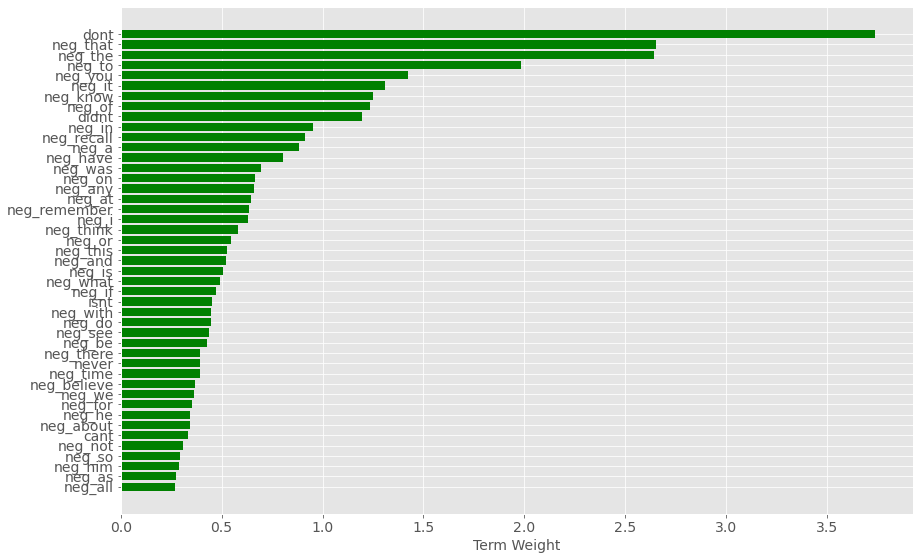

In [68]:
%matplotlib inline
plt.style.use("ggplot")
matplotlib.rcParams.update({"font.size": 14})
plot_top_term_weights( terms_nn, H, 2, 45 )

Let's analyze coherence to choose the optimal value for the number of topics

In [70]:
kmin, kmax = 2, 10
from sklearn import decomposition
topic_models = []
# try each value of k
for k in range(kmin,kmax+1):
    print("Applying NMF for k=%d ..." % k )
    # run NMF
    model = decomposition.NMF( init="nndsvd", n_components=k ) 
    W = model.fit_transform( tfidf_nonames )
    H = model.components_    
    # store for later
    topic_models.append( (k,W,H) )

Applying NMF for k=2 ...
Applying NMF for k=3 ...
Applying NMF for k=4 ...
Applying NMF for k=5 ...
Applying NMF for k=6 ...
Applying NMF for k=7 ...
Applying NMF for k=8 ...
Applying NMF for k=9 ...
Applying NMF for k=10 ...


In [71]:
%matplotlib inline
plt.style.use("ggplot")
matplotlib.rcParams.update({"font.size": 14})

In [72]:
k_values = []
coherences = []
for (k,W,H) in topic_models:
    # Get all of the topic descriptors - the term_rankings, based on top 10 terms
    term_rankings = []
    for topic_index in range(k):
        term_rankings.append(get_descriptor(terms_nn, H, topic_index, 20))
    # Now calculate the coherence based on our Word2vec model
    k_values.append(k)
    coherences.append(calculate_coherence(w2v_model, term_rankings))
    print("K=%02d: Coherence=%.4f" % ( k, coherences[-1]))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:105: DeprecationWarning: Call to deprecated `__contains__` (Method will be removed in 4.0.0, use self.wv.__contains__() instead).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:108: DeprecationWarning: Call to deprecated `__contains__` (Method will be removed in 4.0.0, use self.wv.__contains__() instead).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:112: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).


K=02: Coherence=0.3262
K=03: Coherence=0.3038
K=04: Coherence=0.3021
K=05: Coherence=0.2985
K=06: Coherence=0.2898
K=07: Coherence=0.2850
K=08: Coherence=0.3035
K=09: Coherence=0.2923
K=10: Coherence=0.2845


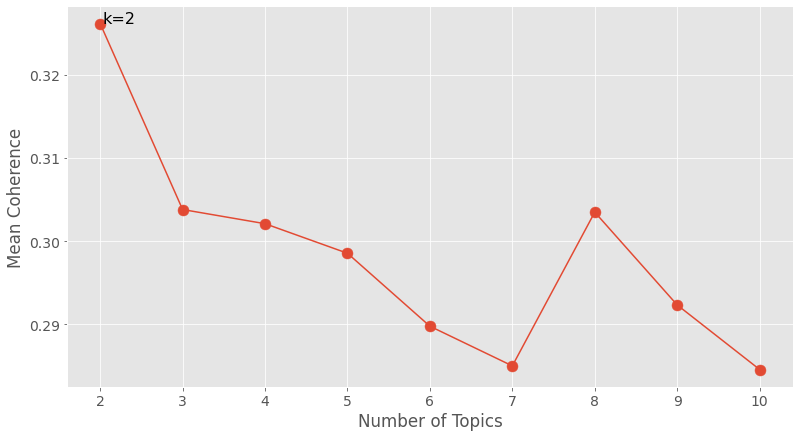

In [73]:
fig = plt.figure(figsize=(13,7))
# create the line plot
ax = plt.plot( k_values, coherences )
plt.xticks(k_values)
plt.xlabel("Number of Topics")
plt.ylabel("Mean Coherence")
# add the points
plt.scatter( k_values, coherences, s=120)
# find and annotate the maximum point on the plot
ymax = max(coherences)
xpos = coherences.index(ymax)
best_k = k_values[xpos]
plt.annotate( "k=%d" % best_k, xy=(best_k, ymax), xytext=(best_k, ymax), textcoords="offset points", fontsize=16)
# show the plot
plt.show()

The optimal number seems to be $k=2$

## Setting k = 2




In [74]:
k = 2
model2_nonames = decomposition.NMF(init="nndsvd", n_components=k ) 
# apply the model and extract the two factor matrices
W = model2_nonames.fit_transform(tfidf_nonames)
H = model2_nonames.components_

In [75]:
descriptors = []
for topic_index in range(k):
    descriptors.append(get_descriptor(terms_nn, H, topic_index, 30))
    str_descriptor = ", ".join( descriptors[topic_index])
    print("Topic %02d: %s" % ( topic_index+1, str_descriptor))

Topic 01: objection, speculation, calls, hearsay, leading, irrelevant, argumentative, vague, answered, misstates, asked, question, scope, beyond, sustained, testimony, assumes, neg_foundation, neg_evidence, form, facts, object, neg_in, overruled, foundation, strike, compound, move, improper, approach
Topic 02: right, thats, see, may, time, dont, jury, neg_the, counsel, please, neg_that, could, correct, lets, think, miss, going, neg_to, back, question, take, sir, point, let, ask, go, neg_you, know, witness, record


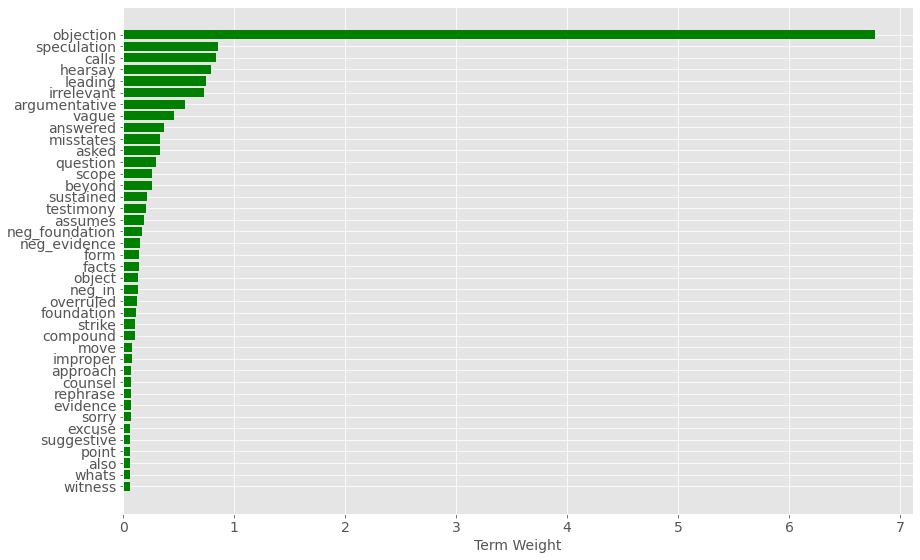

In [77]:
%matplotlib inline
plt.style.use("ggplot")
matplotlib.rcParams.update({"font.size": 14})
plot_top_term_weights(terms_nn, H, 0, 40)

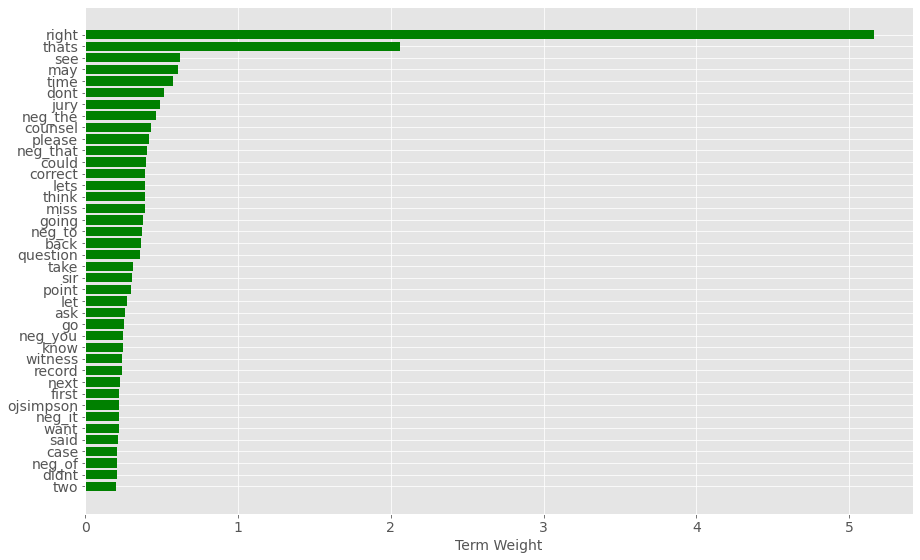

In [78]:
plot_top_term_weights(terms_nn, H, 1, 40)

In [79]:
# Create a DataFrame: components_df
components_df2 = pd.DataFrame(H, columns = tfidf_vectorizer.get_feature_names())
components_df2

,aa,aan,aand,aare,aaronson,aaronsons,aas,aat,aattorneys,ab,abag,aband,abandon,abandoned,abbreviation,abc,abdomen,abdominal,abe,abernathy,abetter,abetween,abide,abiding,abig,abilities,ability,abilityto,abindle,abit,ablack,ablanket,able,ableto,ablind,ablood,abloodstain,abloody,ably,abnormal,...,youwhat,youwhen,youwhether,youwill,youwish,youwith,youwont,youwould,youwouldnt,youwrite,youwrote,youyesterday,youyou,youyouyou,yow,yshaped,yttrium,yup,zabell,zack,zajac,zeal,zealand,zeigler,zero,zeroes,zigzag,ziona,zip,ziplock,zipper,zlomsowitch,zone,zoology,zoom,zoomed,zoomin,zooming,zulema,zx
0,0.000044,0.000194,0.000000,0.000000,0.00000,0.000000,0.000002,0.000000,1.890119e-07,0.000000,0.000000,0.000000,0.000019,0.000006,0.000000,0.000000,0.00000,0.000000,0.000000,0.000105,0.000005,0.000000,0.000157,0.000024,0.000008,0.000055,0.000497,8.708484e-07,0.000000,7.060831e-07,0.000032,6.010087e-07,0.001083,0.000011,0.000000,0.0000,0.000000,0.000003,0.000003,0.000004,...,0.000008,0.000000,0.000024,0.000043,8.880696e-07,0.000006,0.000000,0.000000,0.000000,0.000000,0.000000,0.000028,0.000016,0.000000,0.000001,0.00000,0.000000,0.00000,0.000008,0.000031,0.000015,0.000001,0.000000,0.000000,0.000018,0.00000,0.000003,1.126295e-08,0.000000,0.000000,0.000000,0.000014,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000915,0.000282,0.000901,0.000226,0.00568,0.000484,0.000145,0.000304,3.052668e-05,0.001437,0.000151,0.000156,0.000092,0.000312,0.000222,0.002076,0.00086,0.001782,0.000122,0.000194,0.000234,0.000288,0.001096,0.000063,0.000136,0.000417,0.008097,1.329075e-04,0.000464,3.006421e-04,0.000210,8.534043e-05,0.058730,0.001146,0.000107,0.0004,0.000725,0.000196,0.000136,0.000269,...,0.000386,0.000542,0.000422,0.001681,1.195089e-04,0.000579,0.000112,0.004897,0.000575,0.000168,0.000536,0.000203,0.000542,0.000171,0.000188,0.00006,0.000075,0.00025,0.000244,0.000538,0.000147,0.000098,0.000068,0.000156,0.001404,0.00015,0.000285,8.230176e-05,0.000448,0.000316,0.001058,0.000112,0.000449,0.000094,0.004946,0.000349,0.000336,0.001226,0.000283,0.000133


## Visualization with word cloud

In [80]:
list_bytopic = list()
for row in range(0, components_df2.shape[0]):
  topic = components_df2.iloc[[row]]
  topic = topic.sort_values(by = row, axis=1, ascending=False)
  key_topic = list(topic.columns)
  val_topic = list(topic.iloc[0])
  zip_iterator = zip( key_topic, val_topic)
  dict_topic = dict(zip_iterator)
  list_bytopic.append(dict_topic)

In [81]:
def similar_color_func(word=None, font_size=None,
                       position=None, orientation=None,
                       font_path=None, random_state=None):
  h = 346 # 0 - 360
  s = 86 # 0 - 100
  l = random_state.randint(30, 60) # 0 - 100
  return "hsl({}, {}%, {}%)".format(h, s, l)

### Topic 1

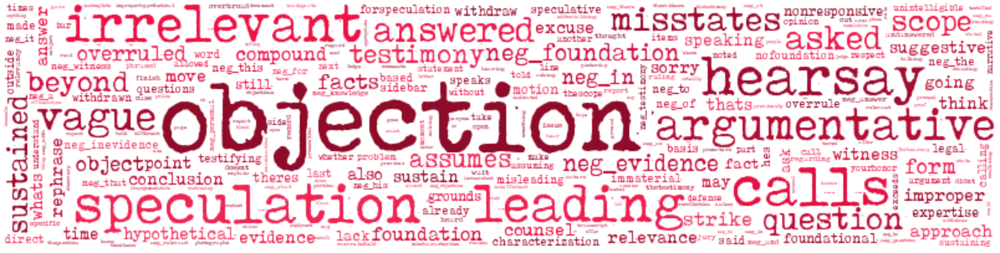

In [82]:
font_path = '/content/drive/MyDrive/Tox Typewriter.ttf'
#mask = np.array(Image.open('/content/drive/MyDrive/Cattura.JPG'))
wordcloud = WordCloud(width=800, height=200,color_func=similar_color_func,max_words=1628,font_path=font_path, background_color='white',normalize_plurals=False).generate_from_frequencies(list_bytopic[0])
plt.figure( figsize=(50,30) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
#plt.savefig("Topic1nonames.png")
#files.download("Topic1nonames.png")
plt.show()

### Topic 2

In [83]:
def similar_color_func(word=None, font_size=None,
                       position=None, orientation=None,
                       font_path=None, random_state=None):
  h = 201 # 0 - 360
  s = 92 # 0 - 100
  l = random_state.randint(5, 28) # 0 - 100
  return "hsl({}, {}%, {}%)".format(h, s, l)

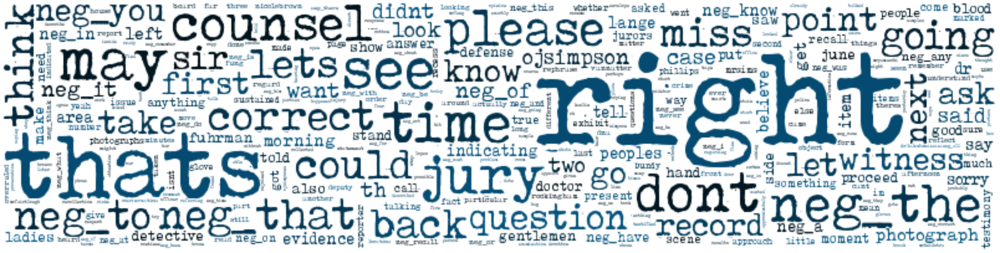

In [84]:

#mask = np.array(Image.open('/content/drive/MyDrive/cochran2.JPG'))
wordcloud = WordCloud(width=800, height=200,color_func=similar_color_func,max_words=1628,font_path=font_path, background_color='white',normalize_plurals=False).generate_from_frequencies(list_bytopic[1])
#wordcloud = WordCloud(width=mask.shape[1], height=600,max_words=1628, font_path=font_path, background_color='white',normalize_plurals=False).generate_from_frequencies(list_bytopic[0])
plt.figure( figsize=(50,30) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
#plt.savefig("Topic2nonames.png")
#files.download("Topic2nonames.png") 
plt.show()


In [89]:
nmf_features2 = model2_nonames.transform(tfidf_nonames)
features = pd.DataFrame(nmf_features2)
predicted_topic = list()
for row in range(0, features.shape[0]):
    predicted_topic.append(topic)
features['topic'] = predicted_topic
features['topic'].value_counts()

1    216744
0     17956
Name: topic, dtype: int64

In [90]:
features['person'] = df.person
features

,0,1,topic,person
0,0.000210,0.013560,1,thecourt
1,0.000010,0.025579,1,thecourt
2,0.000153,0.007429,1,mrgoldberg
3,0.000399,0.012650,1,mrscheck
4,0.035660,0.001463,0,thecourt
...,...,...,...,...
234695,0.001145,0.003942,1,mrcochran
234696,0.000058,0.003885,1,thecourt
234697,0.000008,0.003470,1,thecourt
234698,0.000227,0.003133,1,msclark


In [93]:
features['class'] = class_person
features['date'] = df.date
pd.DataFrame(features.groupby(["topic","class"]).size())

0
topic class             
0     court         3639
      defense       5157
      experts        355
      others        1516
      prosecution   7289
1     court        27323
      defense      67062
      experts      12542
      others       41787
      prosecution  68030

In [94]:
# Save results to csv
#features.to_csv('featuresnonames2d.csv')

From the descriptors, it is clear that there are still some non-relevant words which are making the modelling task more difficult. More steps can be done to improve the results

# Removing other stopwords

In [95]:
people = court + dream_team + prosecution + experts 
other_todrop = ['right', 'could','overruled', 'yeah', 'ask','question', 'may', 'approach', 'answer', 'repeat', 'rephras','object','like','sustain','neg', 'never','wasnt','didnt', 'dont','go']
other_todrop2 = ['please','thats','sorry','cant','really', 'thing', 'im','assum','miss', 'let', 'abl', 'with', 'the','form','irrelevant','beyond','scope','lead','doesnt','say','counsel','attorney','moment','stop','said','think','believ','correct','first','time','sir','isnt']
to_drop2 = people + other_todrop + other_todrop2

In [96]:
df['final'] = df['tokenized'].apply(lambda x: keep(x, to_drop2))
text_final = df['final']
tfidf_final = tfidf_vectorizer.fit_transform(text_final)

In [98]:
model_final = NMF(n_components = 10, random_state=5)
# Fit the model to TF-IDF
model_final.fit(tfidf_final)
# Transform the TF-IDF: nmf_features
nmf_features_final = model_final.transform(tfidf_final)

In [99]:
num_topics = 10
nmf_df = get_nmf_topics(model_final, 10)
nmf_df

,Topic # 01,Topic # 02,Topic # 03,Topic # 04,Topic # 05,Topic # 06,Topic # 07,Topic # 08,Topic # 09,Topic # 10
0,see,back,calls,jury,th,point,lange,know,next,fuhrman
1,photograph,evidence,speculation,ladies,june,foundation,tell,far,witness,detective
2,reporter,case,argumentative,gentlemen,morning,understand,detective,mean,peoples,phillips
3,look,two,conclusion,morning,july,leave,vannatter,want,photograph,vannatter
4,ever,take,facts,record,date,make,recall,people,marked,told
5,sidebar,item,vague,take,august,conversation,kaelin,talking,order,mark
6,side,also,also,open,saw,made,photograph,need,exhibit,officer
7,area,look,forspeculation,reflect,fung,phillips,ever,name,show,conversation
8,monitor,want,strike,stand,night,want,saw,wanted,happened,saw
9,bar,blood,still,rejoined,taken,still,recognize,long,stand,scene


In [100]:
k = 10
model_final = decomposition.NMF(init="nndsvd", n_components = k) 
# apply the model and extract the two factor matrices
W = model_final.fit_transform(tfidf_final)
H = model_final.components_

In [102]:
terms_final = tfidf_vectorizer.get_feature_names()
descriptors = []
for topic_index in range(k):
    descriptors.append( get_descriptor( terms_final, H, topic_index, 30) )
    str_descriptor = ", ".join( descriptors[topic_index] )
    print("Topic %02d: %s" % ( topic_index+1, str_descriptor ) )

Topic 01: see, photograph, reporter, look, ever, sidebar, side, area, monitor, bar, blood, kaelin, drlakshmanan, photographs, picture, indicating, looking, tape, little, riske, looked, location, car, left, hand, inside, top, bag, videotape, anyone
Topic 02: back, evidence, case, two, take, item, look, also, want, blood, get, dr, area, put, doctor, scene, way, make, fact, items, saw, left, number, mean, people, told, bundy, come, photographs, show
Topic 03: calls, speculation, argumentative, conclusion, facts, vague, also, forspeculation, strike, still, foundation, phone, move, opinion, compound, nofoundation, motion, calling, conjecture, made, lack, excuse, legal, call, witness, part, fact, yourhonor, overbroad, defense
Topic 04: jury, ladies, gentlemen, morning, record, take, open, reflect, stand, rejoined, recess, afternoon, members, panel, remember, beseated, witness, step, admonitions, disregard, present, seated, need, jurors, grand, resume, weve, matter, proceed, oclock
Topic 05: 

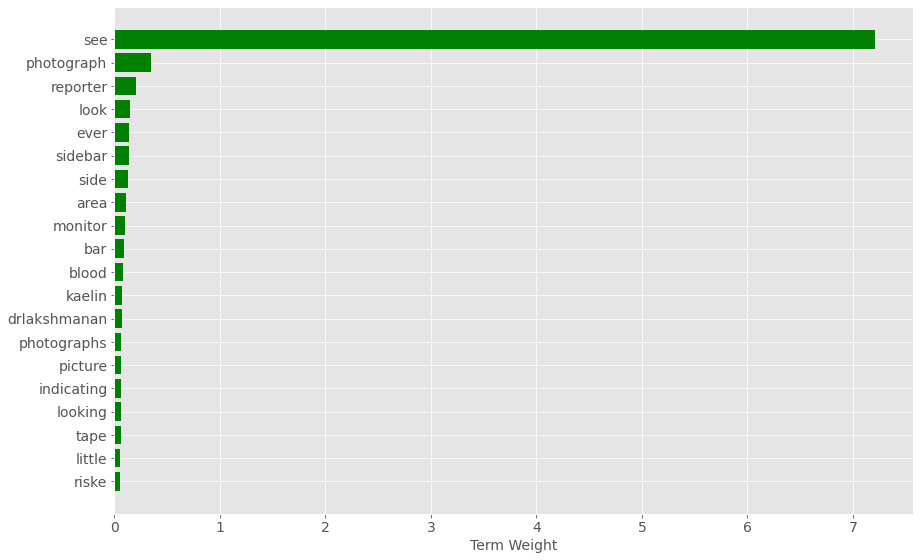

In [104]:
%matplotlib inline
plt.style.use("ggplot")
matplotlib.rcParams.update({"font.size": 14})
plot_top_term_weights(terms_final, H, 0, 20)

The results have improved, let's look now at the coherence metric

In [106]:
kmin, kmax = 2, 20
from sklearn import decomposition
topic_models = []
# try each value of k
for k in range(kmin,kmax+1):
    print("Applying NMF for k=%d ..." % k )
    # run NMF
    model = decomposition.NMF( init="nndsvd", n_components=k ) 
    W = model.fit_transform( tfidf_final)
    H = model.components_    
    # store for later
    topic_models.append( (k,W,H) )

Applying NMF for k=2 ...
Applying NMF for k=3 ...
Applying NMF for k=4 ...
Applying NMF for k=5 ...
Applying NMF for k=6 ...
Applying NMF for k=7 ...
Applying NMF for k=8 ...
Applying NMF for k=9 ...
Applying NMF for k=10 ...
Applying NMF for k=11 ...
Applying NMF for k=12 ...
Applying NMF for k=13 ...
Applying NMF for k=14 ...
Applying NMF for k=15 ...
Applying NMF for k=16 ...
Applying NMF for k=17 ...
Applying NMF for k=18 ...
Applying NMF for k=19 ...
Applying NMF for k=20 ...


In [108]:
%matplotlib inline
plt.style.use("ggplot")
matplotlib.rcParams.update({"font.size": 14})
k_values = []
coherences = []
for (k,W,H) in topic_models:
    # Get all of the topic descriptors - the term_rankings, based on top 10 terms
    term_rankings = []
    for topic_index in range(k):
        term_rankings.append(get_descriptor(terms_nn, H, topic_index, 20))
    # Now calculate the coherence based on our Word2vec model
    k_values.append(k)
    coherences.append(calculate_coherence(w2v_model, term_rankings))
    print("K=%02d: Coherence=%.4f" % ( k, coherences[-1]))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:105: DeprecationWarning: Call to deprecated `__contains__` (Method will be removed in 4.0.0, use self.wv.__contains__() instead).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:108: DeprecationWarning: Call to deprecated `__contains__` (Method will be removed in 4.0.0, use self.wv.__contains__() instead).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:112: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).


K=02: Coherence=0.3120
K=03: Coherence=0.3160
K=04: Coherence=0.2894
K=05: Coherence=0.2880
K=06: Coherence=0.3062
K=07: Coherence=0.3059
K=08: Coherence=0.3277
K=09: Coherence=0.3292
K=10: Coherence=0.3342
K=11: Coherence=0.3280
K=12: Coherence=0.3261
K=13: Coherence=0.3411
K=14: Coherence=0.3271
K=15: Coherence=0.3504
K=16: Coherence=0.3309
K=17: Coherence=0.3261
K=18: Coherence=0.3411
K=19: Coherence=0.3260
K=20: Coherence=0.3221


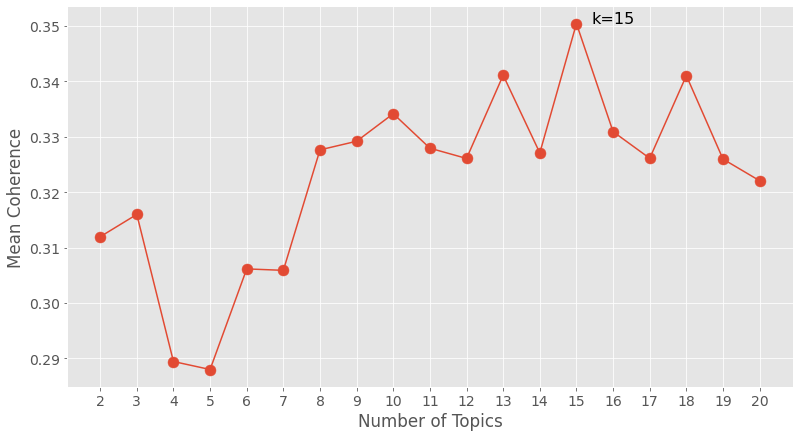

In [109]:
fig = plt.figure(figsize=(13,7))
# create the line plot
ax = plt.plot( k_values, coherences )
plt.xticks(k_values)
plt.xlabel("Number of Topics")
plt.ylabel("Mean Coherence")
# add the points
plt.scatter( k_values, coherences, s=120)
# find and annotate the maximum point on the plot
ymax = max(coherences)
xpos = coherences.index(ymax)
best_k = k_values[xpos]
plt.annotate( "k=%d" % best_k, xy=(best_k, ymax), xytext=(best_k, ymax), textcoords="offset points", fontsize=16)
# show the plot
plt.show()

## Selecting k = 14

In [110]:
k = 14
model = decomposition.NMF(init="nndsvd", n_components=k ) 
# apply the model and extract the two factor matrices
W = model.fit_transform(tfidf_final)
H = model.components_

In [111]:
descriptors = []
for topic_index in range(k):
    descriptors.append(get_descriptor(terms_final, H, topic_index, 30))
    str_descriptor = ", ".join( descriptors[topic_index])
    print("Topic %02d: %s" % ( topic_index+1, str_descriptor))

Topic 01: see, photograph, reporter, look, ever, sidebar, side, area, monitor, bar, kaelin, blood, picture, indicating, looking, tape, little, location, photographs, looked, riske, car, inside, bag, left, drlakshmanan, hand, top, videotape, white
Topic 02: two, case, also, blood, dr, doctor, area, want, saw, get, fact, mean, told, make, way, three, recall, left, nicolebrown, photographs, show, scene, drlakshmanan, people, sure, made, done, defense, many, put
Topic 03: calls, speculation, argumentative, conclusion, facts, vague, forspeculation, strike, also, still, foundation, phone, move, compound, nofoundation, motion, opinion, calling, conjecture, made, lack, legal, excuse, call, witness, yourhonor, overbroad, part, narrative, defense
Topic 04: jury, ladies, gentlemen, morning, record, open, reflect, stand, rejoined, recess, afternoon, members, panel, remember, beseated, witness, step, disregard, admonitions, seated, grand, resume, weve, present, jurors, need, proceed, oclock, matter

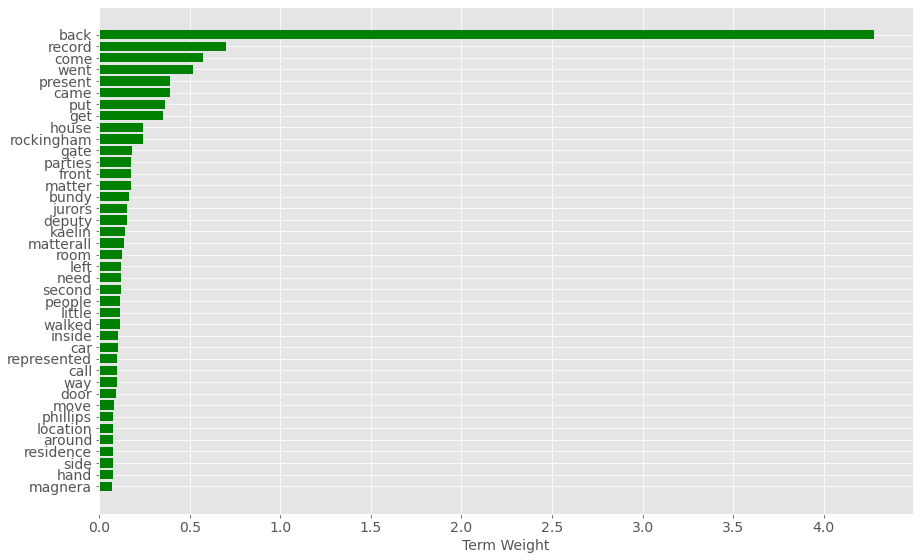

In [113]:
%matplotlib inline
plt.style.use("ggplot")
matplotlib.rcParams.update({"font.size": 14})
plot_top_term_weights(terms_final, H, 13, 40)

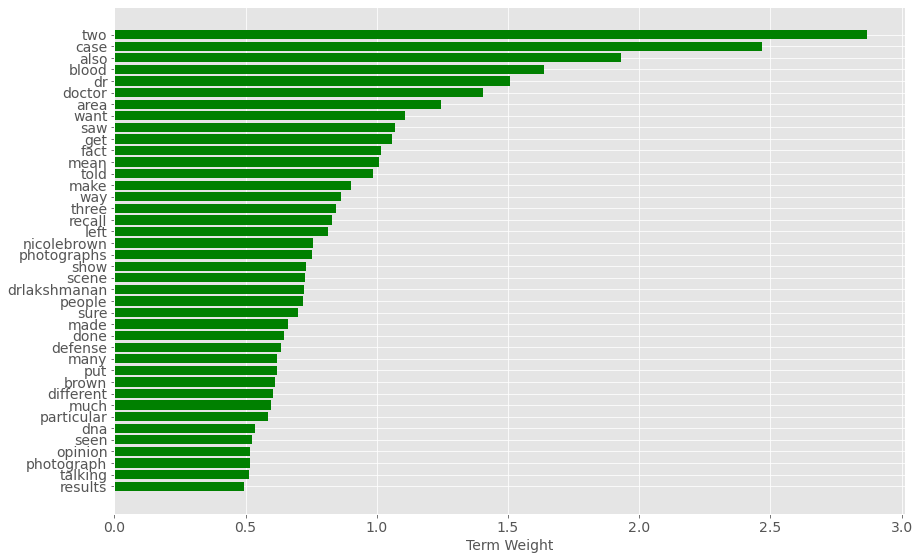

In [114]:
plot_top_term_weights(terms_final, H, 1, 40)

In [115]:
# Create a DataFrame: components_df
tfidf_vectorizer = TfidfVectorizer(
    min_df=3,
    max_df=0.85,
    ngram_range=(1, 1),
    preprocessor=' '.join
)
#components_df = pd.DataFrame(H, columns = tfidf_vectorizer.get_feature_names())
components_df = pd.DataFrame(H, columns = terms_final)
components_df

,aa,aan,aand,aare,aaronson,aaronsons,aas,aat,ab,abag,aband,abandon,abandoned,abbreviation,abc,abdomen,abdominal,abe,abernathy,abetter,abetween,abide,abiding,abig,abilities,ability,abilityto,abindle,abit,abnormal,abnormality,abo,aboard,aboudram,abouta,aboutabout,aboutall,aboutand,aboutbetween,aboutbut,...,youwere,youwerent,youwhat,youwhen,youwill,youwish,youwont,youwould,youwouldnt,youwrite,youwrote,youyesterday,youyou,youyouyou,yow,yshaped,yttrium,yup,zabell,zack,zajac,zeal,zealand,zeigler,zero,zeroes,zigzag,ziona,zip,ziplock,zipper,zlomsowitch,zone,zoology,zoom,zoomed,zoomin,zooming,zulema,zx
0,0.000000,0.000000,0.000283,0.000000,0.000387,0.000000,0.000026,0.000000,0.000000,0.000000,0.000397,0.000000,0.000000,0.000000,0.000000,0.000187,0.000356,0.000431,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000710,0.000000,0.000000,0.000000,0.001119,0.000228,0.000000,0.000000,0.000000,0.000000,0.000000,0.000153,0.001140,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000,0.000335,0.001903,0.000026,0.000150,0.002568,0.000000,0.000130,0.000000,0.000000,0.000242,0.000076,0.000000,0.000559,0.000000,0.002214,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000097,0.000007,0.000511,0.002551,0.000000e+00,0.000000,0.000000e+00,0.005951,0.003062,0.000810,0.000000,0.000929,0.000064
1,0.004171,0.001022,0.005327,0.000393,0.005097,0.000709,0.001490,0.000482,0.005541,0.000938,0.000675,0.000207,0.001415,0.000734,0.006305,0.004766,0.009931,0.001296,0.002295,0.001448,0.000076,0.004525,0.000345,7.891390e-04,0.001974,0.054213,0.001177,0.000462,0.001225,0.001144,0.000385,0.015989,0.000713,0.001316,0.003461,0.002360,0.000287,0.001343,4.473071e-04,0.000258,...,0.026576,0.000639,0.001553,0.002116,0.005442,0.001069,0.000463,0.020220,0.002027,0.000815,0.001461,0.000250,0.002926,0.000465,0.000670,0.000283,0.000790,0.000480,0.003267,0.003772,0.000894,0.000286,0.000486,3.314926e-04,0.007336,0.000984,0.001512,0.000565,0.000361,0.000519,0.001321,4.294406e-04,0.001406,4.053496e-04,0.007973,0.000706,0.000552,0.000213,0.000000,0.000348
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.721977e-07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000105,0.000000,0.000000,0.000003,0.000000,1.339594e-07,0.000000,...,0.000000,0.000000,0.000004,0.000000,0.000000,0.000000,0.000000,0.000008,0.000008,0.000000,0.000000,0.000004,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.212188e-07,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000026
3,0.000000,0.000004,0.000106,0.000000,0.002912,0.000023,0.000000,0.000000,0.000000,0.000000,0.000299,0.000000,0.000049,0.000000,0.000000,0.000000,0.000000,0.000000,0.000334,0.000033,0.000000,0.001013,0.000271,5.750260e-05,0.000253,0.001219,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000530,0.000000,0.000472,0.000704,0.000000e+00,0.000007,...,0.001764,0.000000,0.000000,0.000990,0.000868,0.000022,0.000000,0.000000,0.000000,0.000539,0.000073,0.000642,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000383,0.000000,0.000000e+00,0.000879,0.000000,0.000000,0.000060,0.000092,0.000000,0.000000,4.865287e-04,0.000000,0.000000e+00,0.000000,0.000191,0.000000,0.000000,0.000000,0.000064
4,0.000000,0.000016,0.000000,0.000000,0.004982,0.001063,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000317,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000577,0.000000,3.786962e-05,0.000000,0.000000,0.000000,0.000010,0.000000,0.000000,0.000000,0.000000,0.000000,0.000004,0.000000,0.000000,0.000009,0.000094,0.000000e+00,0.000000,...,0.008921,0.000000,0.000829,0.000000,0.000

### Visualize some of the topics with word cloud

In [116]:
list_bytopic = list()
for row in range(0, components_df.shape[0]):
  topic = components_df.iloc[[row]]
  topic = topic.sort_values(by = row, axis=1, ascending=False)
  key_topic = list(topic.columns)
  val_topic = list(topic.iloc[0])
  zip_iterator = zip( key_topic, val_topic)
  dict_topic = dict(zip_iterator)
  list_bytopic.append(dict_topic)

In [117]:
def similar_color_func(word=None, font_size=None,
                       position=None, orientation=None,
                       font_path=None, random_state=None):
  h = 22 # 0 - 360
  s = 100 # 0 - 100
  l = random_state.randint(5, 43) # 0 - 100
  return "hsl({}, {}%, {}%)".format(h, s, l)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

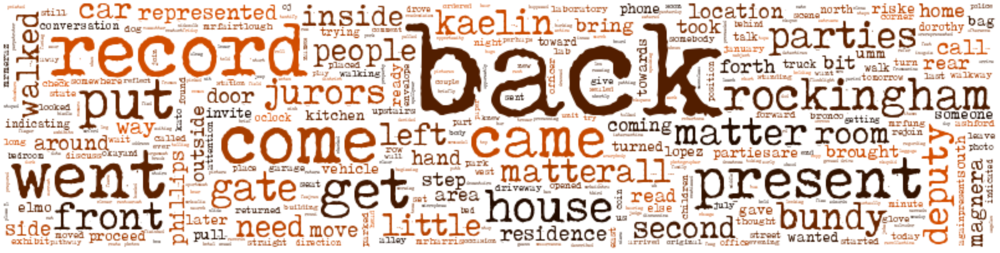

In [118]:
font_path = '/content/drive/MyDrive/Tox Typewriter.ttf'
#mask = np.array(Image.open('/content/drive/MyDrive/Cattura.JPG'))
wordcloud = WordCloud(width=800, height=200,color_func=similar_color_func,max_words=1628,font_path=font_path, background_color='white',normalize_plurals=False).generate_from_frequencies(list_bytopic[13])
plt.figure( figsize=(50,30) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.savefig("Topic14.png")
files.download("Topic14.png")
plt.show()

In [119]:
def similar_color_func(word=None, font_size=None,
                       position=None, orientation=None,
                       font_path=None, random_state=None):
  h = 201 # 0 - 360
  s = 92 # 0 - 100
  l = random_state.randint(5, 28) # 0 - 100
  return "hsl({}, {}%, {}%)".format(h, s, l)

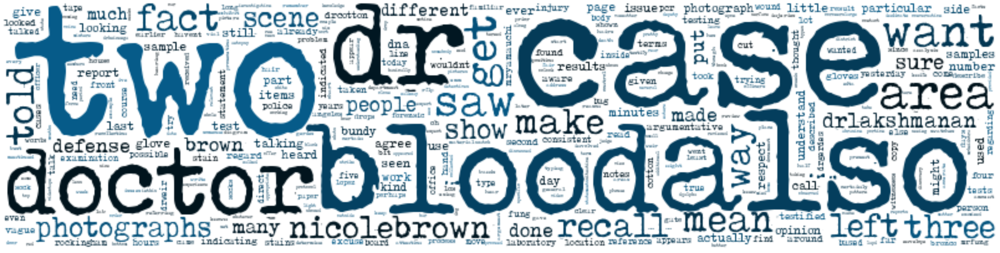

In [120]:

#mask = np.array(Image.open('/content/drive/MyDrive/cochran2.JPG'))
wordcloud = WordCloud(width=800, height=200,color_func=similar_color_func,max_words=1628,font_path=font_path, background_color='white',normalize_plurals=False).generate_from_frequencies(list_bytopic[1])
#wordcloud = WordCloud(width=mask.shape[1], height=600,max_words=1628, font_path=font_path, background_color='white',normalize_plurals=False).generate_from_frequencies(list_bytopic[0])
plt.figure( figsize=(50,30) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
#plt.savefig("Topic2nonames.png")
#files.download("Topic2nonames.png") 
plt.show()


### Generate features matrix

In [122]:
nmf_features = model.transform(tfidf_final)
features = pd.DataFrame(nmf_features)
features

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,0.000000,0.000000,0.0,0.011585,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002237,0.0,0.000296,0.084784
1,0.000000,0.003379,0.0,0.033757,0.000000,0.000211,0.000000,0.000673,0.000000,0.000000,0.000000,0.0,0.030207,0.004961
2,0.000024,0.008976,0.0,0.000710,0.001971,0.000632,0.000000,0.000144,0.000237,0.000000,0.003431,0.0,0.000319,0.002472
3,0.000356,0.011639,0.0,0.000000,0.000000,0.000254,0.000680,0.001047,0.000307,0.000089,0.000735,0.0,0.014310,0.000074
4,0.000000,0.008837,0.0,0.000017,0.003611,0.000327,0.003303,0.000049,0.000000,0.000428,0.001629,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234695,0.000029,0.000737,0.0,0.001837,0.001329,0.000167,0.000062,0.000053,0.000023,0.000201,0.000000,0.0,0.000500,0.000517
234696,0.000000,0.002461,0.0,0.018417,0.000237,0.000408,0.000000,0.000275,0.000000,0.000000,0.000000,0.0,0.016979,0.000000
234697,0.000026,0.006544,0.0,0.001526,0.000000,0.000350,0.000000,0.000605,0.001175,0.000042,0.000000,0.0,0.000625,0.000051
234698,0.004264,0.000000,0.0,0.001966,0.000000,0.000000,0.000000,0.000008,0.000000,0.000000,0.000000,0.0,0.001384,0.000077


In [125]:
predicted_topic = list()
for row in range(0, features.shape[0]):
    topic = features.iloc[row].idxmax()
    predicted_topic.append(topic)
features['topic'] = predicted_topic
features['topic'].value_counts()

1     109070
0      36172
13     15124
10     11780
11     10756
3       9424
12      7798
9       7438
4       7307
8       5220
5       5099
7       4341
2       2716
6       2455
Name: topic, dtype: int64

In [126]:
features['person'] = df.person
features

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,topic,person
0,0.000000,0.000000,0.0,0.011585,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002237,0.0,0.000296,0.084784,13,thecourt
1,0.000000,0.003379,0.0,0.033757,0.000000,0.000211,0.000000,0.000673,0.000000,0.000000,0.000000,0.0,0.030207,0.004961,3,thecourt
2,0.000024,0.008976,0.0,0.000710,0.001971,0.000632,0.000000,0.000144,0.000237,0.000000,0.003431,0.0,0.000319,0.002472,1,mrgoldberg
3,0.000356,0.011639,0.0,0.000000,0.000000,0.000254,0.000680,0.001047,0.000307,0.000089,0.000735,0.0,0.014310,0.000074,12,mrscheck
4,0.000000,0.008837,0.0,0.000017,0.003611,0.000327,0.003303,0.000049,0.000000,0.000428,0.001629,0.0,0.000000,0.000000,1,thecourt
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234695,0.000029,0.000737,0.0,0.001837,0.001329,0.000167,0.000062,0.000053,0.000023,0.000201,0.000000,0.0,0.000500,0.000517,3,mrcochran
234696,0.000000,0.002461,0.0,0.018417,0.000237,0.000408,0.000000,0.000275,0.000000,0.000000,0.000000,0.0,0.016979,0.000000,3,thecourt
234697,0.000026,0.006544,0.0,0.001526,0.000000,0.000350,0.000000,0.000605,0.001175,0.000042,0.000000,0.0,0.000625,0.000051,1,thecourt
234698,0.004264,0.000000,0.0,0.001966,0.000000,0.000000,0.000000,0.000008,0.000000,0.000000,0.000000,0.0,0.001384,0.000077,0,msclark


In [129]:
features['class'] = class_person
features['date'] = df.date
pd.DataFrame(features.groupby(["topic","class"]).size())

0
topic class             
0     court         6897
      defense       9432
      experts       2179
      others        7606
      prosecution  10058
...                  ...
13    court         2073
      defense       4459
      experts        544
      others        3687
      prosecution   4361

[70 rows x 1 columns]

In [130]:
# Save to csv
#features.to_csv('featuresfinal14.csv')